In [1]:
# importing libraries
import os
from scipy import ndimage
import skimage
from skimage import io
from skimage import img_as_float
import numpy as np
import matplotlib.pyplot as plt
from pylab import *

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
import skimage
import numpy as np
import matplotlib.pyplot as plt
import scipy
from scipy import ndimage

# Zadatak 1

## Glavni deo zadatka

../sekvence/dices\dices1.jpg
../sekvence/dices\dices10.jpg
../sekvence/dices\dices11.jpg
../sekvence/dices\dices12.jpg
../sekvence/dices\dices2.jpg
../sekvence/dices\dices3.jpg
../sekvence/dices\dices4.jpg
../sekvence/dices\dices5.jpg
../sekvence/dices\dices6.jpg
../sekvence/dices\dices7.jpg
../sekvence/dices\dices8.jpg
../sekvence/dices\dices9.jpg


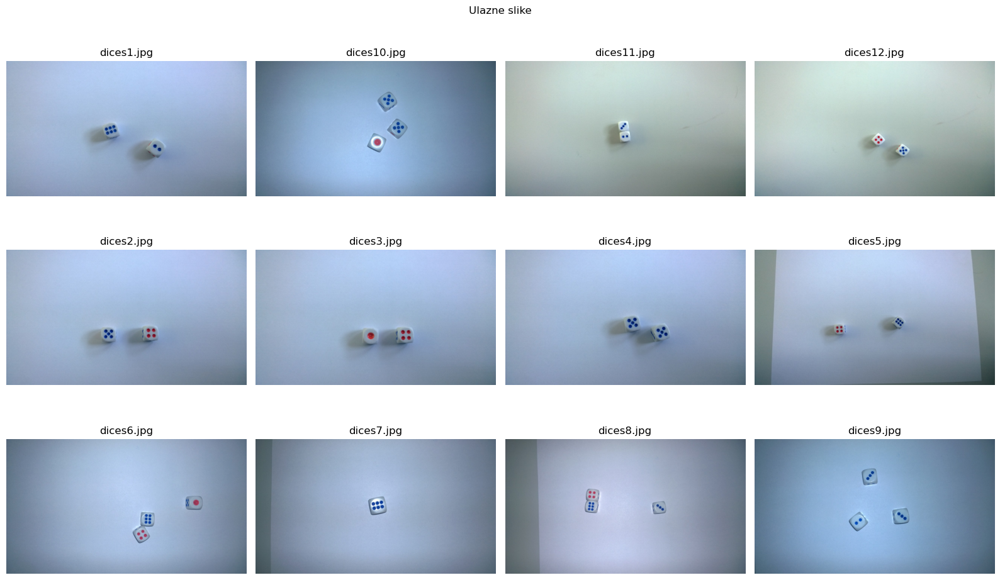

In [2]:
# reading and plotting images
dices = {}
fig, axes  = plt.subplots(ncols = 4, nrows = 3, figsize = (16,10))
ax = axes.ravel()
fig.suptitle('Ulazne slike')
i = 0;
# go through all documents in folder dices
for root, dirs, files in os.walk("../sekvence/dices", topdown=False):
    # go through all files
    for name in files:
        # get current path and print it
        curr_path = os.path.join(root, name)
        print(curr_path)
        # read current image and convert it to [0,1] range
        curr_img = img_as_float(io.imread(curr_path))
        # plot image
        ax[i].imshow(curr_img, cmap = 'jet', vmin = 0, vmax = 1)
        ax[i].set_title(name)
        ax[i].set_axis_off()
        i+=1;
        # if number is less than 10
        if(name[-6]=='s'):
            dices[int(name[-5])] = curr_img
        else:# if number is 10 or above
            dices[int(name[-6:-4])]= curr_img
        
plt.tight_layout()

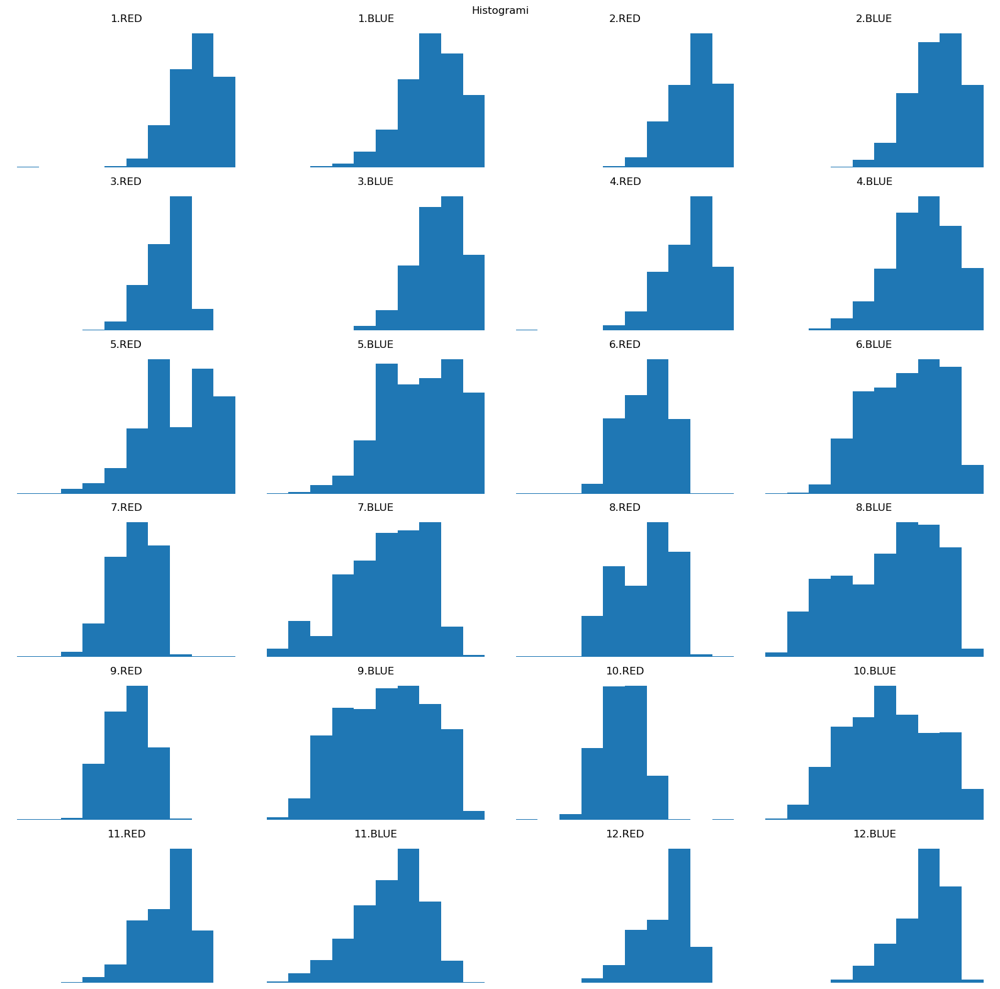

In [3]:
# looking at RGB histograms 
fig, axes = plt.subplots(ncols = 4, nrows = 6, figsize = (16,16))
ax = axes.ravel()
fig.suptitle('Histogrami')
for i in range(1,13):
    ax[2*(i-1)].hist(dices[i][:,:,0].ravel())
    ax[2*(i-1)].set_title(str(i)+'.RED')
    ax[2*(i-1)].set_axis_off()
    ax[2*i-1].hist(dices[i][:,:,2].ravel())
    ax[2*i-1].set_title(str(i)+'.BLUE')
    ax[2*i-1].set_axis_off()

plt.tight_layout()

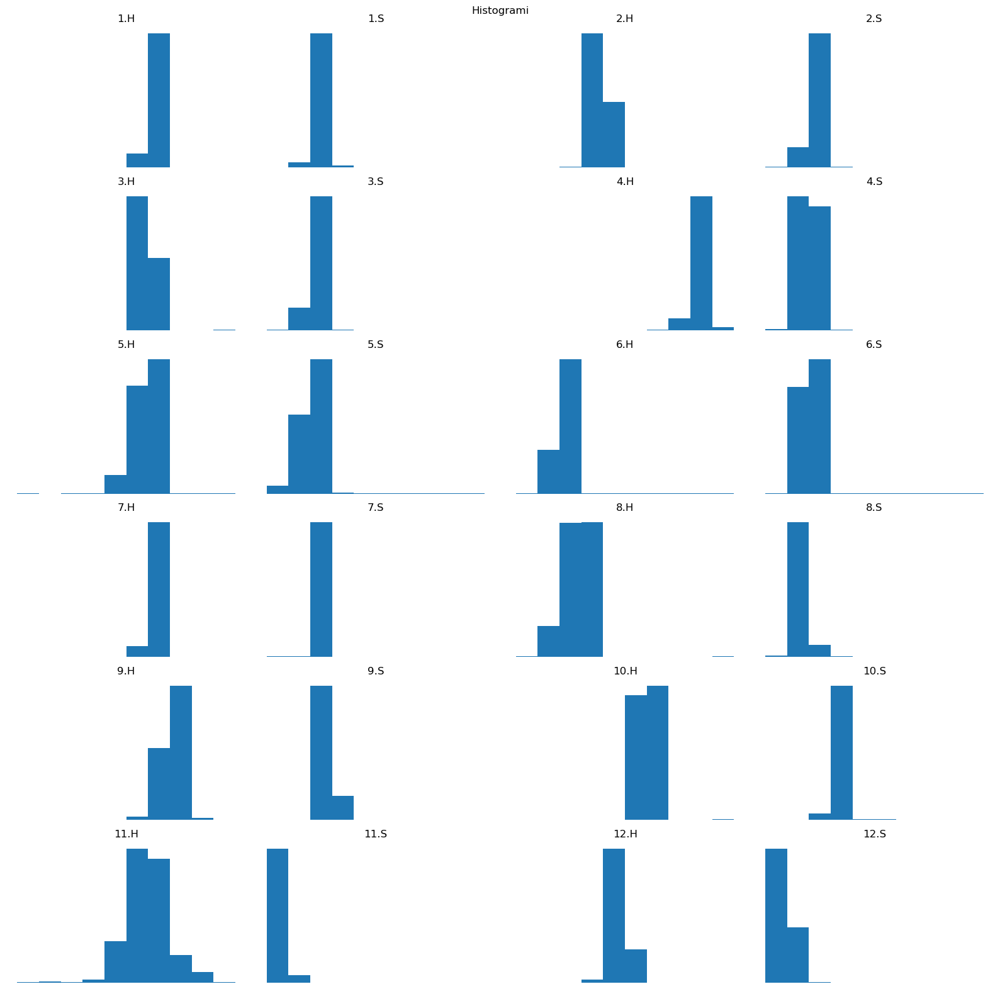

In [4]:
# looking at HSV histograms 
fig, axes = plt.subplots(ncols = 4, nrows = 6, figsize = (16,16))
ax = axes.ravel()
fig.suptitle('Histogrami')
for i in range(1,13):
    ax[2*(i-1)].hist(skimage.color.rgb2hsv(dices[i])[:,:,0].ravel())
    ax[2*(i-1)].set_title(str(i)+'.H')
    ax[2*(i-1)].set_axis_off()
    ax[2*i-1].hist(skimage.color.rgb2hsv(dices[i])[:,:,1].ravel())
    ax[2*i-1].set_title(str(i)+'.S')
    ax[2*i-1].set_axis_off()

plt.tight_layout()

Posmatrajuci histograme slika vidimo da threshold nije moguce postaviti samo na osnovu odvajanja na histogramu pa nam otsu i mean threshold nece biti od pomoci. Kao karakteristicne slike koje cemo nadalje posmatrati uzimamo sledece:

Plava boja:
* slika 10 - zato sto ima cudan odsjaj oko crvene tacke i pozadinu koja vuce na plavo
* slika 6 - zato sto je bocni broj 5 jako vidljiv i moze biti pomesan sa horizontalnim
* slika 3 - da proverimo program za granican slucaj kada je zbir jednak 0

Za crvenu boju su karakteristicne slike mogu ostati iste zato sto svakako moramo proveriti odsjaj i sliku 6 jer je najkompleksnija. Slika 3 je jedna od retkih na kojima imaju dva crvena broja jer su generalno u manjini.

S obzirom da je pozadina bela i blago vuce ka plavoj/zutoj boji u zavisnosti od slike iz rgb kolor sistema cemo teze dobiti 
to sto nam treba zato sto ce i pozadina imati visoke ove komponente. Jedno od resenja bi bilo da trazimo delove gde je niska 
nijansa crvene odnosno plave boje ali i ovakvim pristupom mozemo doci do problema. Iz ovog razloga lakse je da predjemo u HSV
kolor sistem. U HSV kolor sistemu crvenoj boji odgovaraju vrednosti oko 0 i 360 stepeni a plavoj boji oko 240 stepeni. S obzirom da posmatramo opseg 0-1 ovo ce odgovarati vrednostima blizu 1 i 0.66 pa uzimamo neke opsege oko ovih vrednosti. Za s kanal je 
samo bitno da bude dovoljno velik. Nakon ovoga slika se popunjava dilatacijom kako nam ne bi falili delovi tacaka. S obzirom da imamo samo bele tacke od interesa potrebna nam je samo dilatacija a ne i erozija. Nakon toga mozemo povezati segmente. Ovime pored tacaka od interesa dobijamo i tacke na vertikalnim zidovima koje je potrebno ukloniti. Iz tog razloga ogranicavamo povrsinu regija i izdvajamo one od interesa.

In [5]:
def extract_color_dice_score(img, color):
    '''
       input:
             img - rgb image with dices on it
             color - 'red' or 'blue' which sum should be calculated
       output: 
            img_condition - image that shows which parts are selected
            img_dilation - image after dilation
            labeled image - segmented image
            labeled image - segmented image after deleting vertical dots
            sum of digits - sum of digits of given color on image
            dot_regions - found regions of dots
    Function for finding the sum of rolled dices numbers with specific color.
    '''
    output_sums = []
    # converting image to HSV color system
    img_hsv = skimage.color.rgb2hsv(img)
    img_h = img_hsv[:,:,0]
    img_s = img_hsv[:,:,1]
    # setting conditions for blue color
    if(color == 'blue'):# blue condition
        img_condition = (((img_h<0.7)&(img_h>0.6))&(img_s>0.7))
    else:# red condition
        img_condition = ((img_h>0.9) |(img_h<0.1)) & (img_s>0.3)
    # adding dilation( our result are only black dots so there is no need fo erosion)
    img_dilation = skimage.morphology.binary_dilation(img_condition.astype(uint8))
    # labeling connected regions
    labeled_img = skimage.measure.label(img_dilation, background=0)
    # getting region proporties
    regions = skimage.measure.regionprops(labeled_img)
    # labels after deleting vertical dots
    true_labeled_img = labeled_img.copy()
    sum_of_digits = 0;
    # selecting regions where there is a dot
    dot_regions =[]
    for i, region in zip(range(len(regions)), regions):
        # in order to ignore vertical numbers we have to set a treshold to area
        if(  region['Area']>=90 ):
            sum_of_digits+=1;
            dot_regions.append(region)
        else:# deleting unused regions
            true_labeled_img[(true_labeled_img == (i+1))]=0
    # in the beginning every dot is set of itself
    sets = np.arange(1,len(dot_regions)+1)
    for i in range(0, len(dot_regions)):
        for j in range(i+1, len(dot_regions)):
            # if distance between two dots is smaller than 2 times dot diameter than it is same dice
            # ( it could be checked when printing diameters that all dots on one dice have same diameter with error 1)
            center1 = dot_regions[i]['Centroid']
            center2 = dot_regions[j]['Centroid']
            center_dist = np.sqrt(np.square(center1[0]-center2[0])+np.square(center1[1]-center2[1]))
            diameter = np.abs(dot_regions[i].bbox[0]-dot_regions[i].bbox[2])
            if(center_dist<= 2*diameter):
                # if dot i is on same dice as dot j -> set same index
                sets[j] = sets[i]
    #print(np.unique(sets, return_counts = True))
    #print("#############################################")
    
    # 8 10 5 5 5 0 10 6 6 6 9 8
    return (img_condition, img_dilation, labeled_img,true_labeled_img, sum_of_digits,dot_regions )

In [6]:
def plot_blue_score_results(img, plot_title, color): 
    '''
         img -  input image
         plot_title - title of plot 
         color - 'red' or 'blue'
         
         Plots results of extract_color_dice_score function.
    '''
    (img_condition, img_dilation, labeled_img, true_labeled_img,sum_of_digits,_) = extract_color_dice_score(img,color)
    print("Zbir je:"+str(sum_of_digits))
    fig, axes = plt.subplots(ncols = 2, nrows = 3, figsize = (16,10))
    ax = axes.ravel()
    fig.suptitle(plot_title)
    ax[0].imshow(img, cmap = 'jet', vmin = 0, vmax = 1)
    ax[0].set_title('RGB slika')
    ax[0].set_axis_off()
    ax[1].imshow(skimage.color.rgb2hsv(img)[:,:,0], cmap = 'gray', vmin = 0, vmax = 1)
    ax[1].set_title('H kanal HSV slika')
    ax[1].set_axis_off()
    ax[2].imshow(img_condition, cmap = 'gray', vmin = 0, vmax = 1)
    ax[2].set_title('Slika nakon postavljenih uslova')
    ax[2].set_axis_off()
    ax[3].imshow(img_dilation, cmap = 'gray', vmin = 0, vmax = 1)
    ax[3].set_title('Slika nakon dilatacije')
    ax[3].set_axis_off()
    # converting labels in form of numbers to colored image where different regions have different colors
    img_label_overlay = skimage.color.label2rgb(labeled_img, image=img, bg_label=0)
    ax[4].imshow(img_label_overlay, cmap = 'jet', vmin = 0, vmax = 255)
    ax[4].set_title('Slika sa labeliranim svim tackama')
    ax[4].set_axis_off()
    # converting labels in form of numbers to colored image where different regions have different colors
    true_img_label_overlay = skimage.color.label2rgb(true_labeled_img, image=img, bg_label=0)
    ax[5].imshow(true_img_label_overlay, cmap = 'jet', vmin = 0, vmax = 255)
    ax[5].set_title('Slika sa labeliranim samo horizontalnim tackama')
    ax[5].set_axis_off()
    plt.tight_layout()

### Testiranje plavih tacaka

Zbir je:10


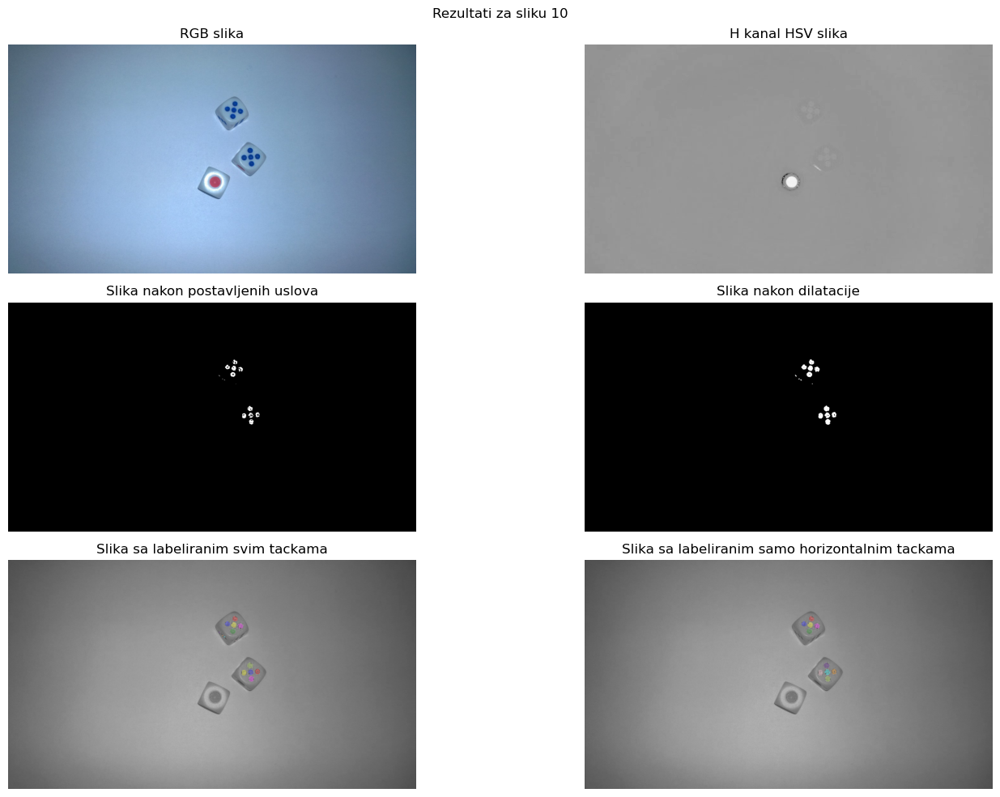

In [7]:
plot_blue_score_results(dices[10], 'Rezultati za sliku 10','blue')

Zbir je:6


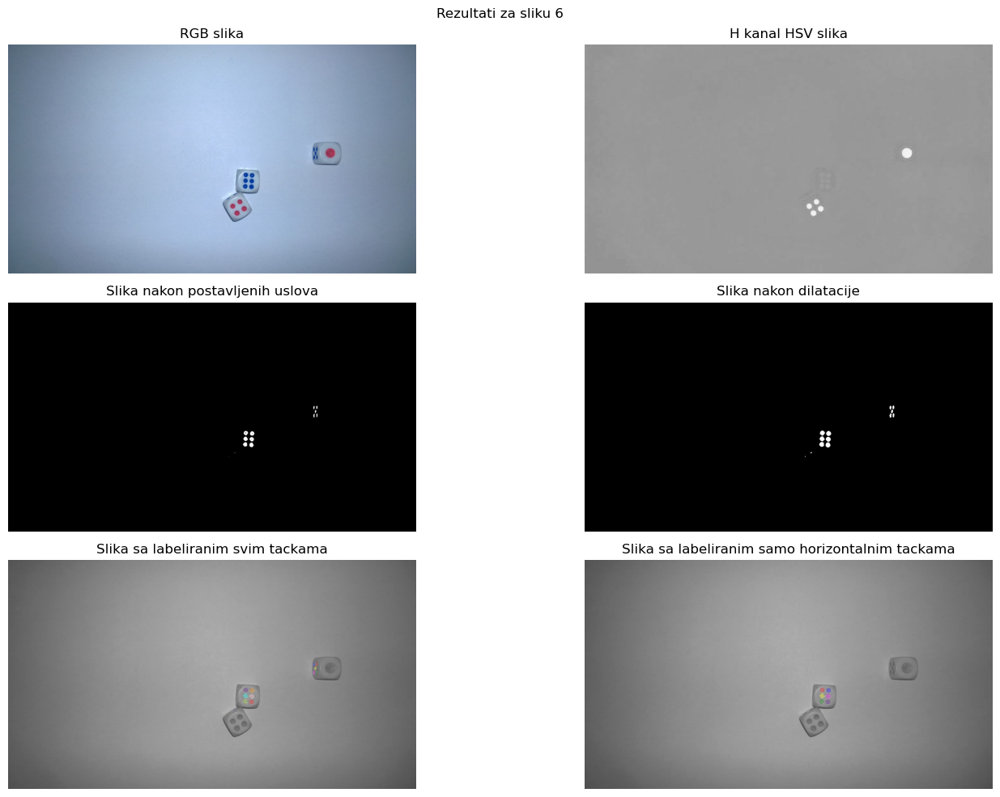

In [8]:
plot_blue_score_results(dices[6], 'Rezultati za sliku 6','blue')

Zbir je:0


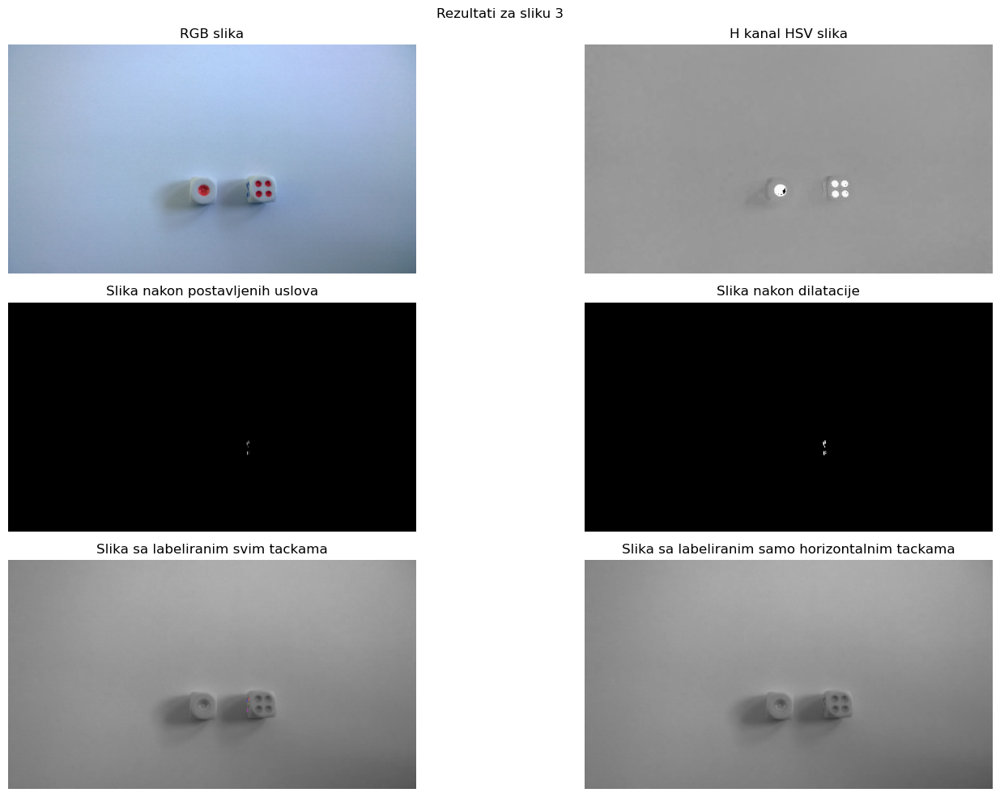

In [9]:
plot_blue_score_results(dices[3], 'Rezultati za sliku 3', 'blue')

### Testiranje crvenih tacaka

Zbir je:1


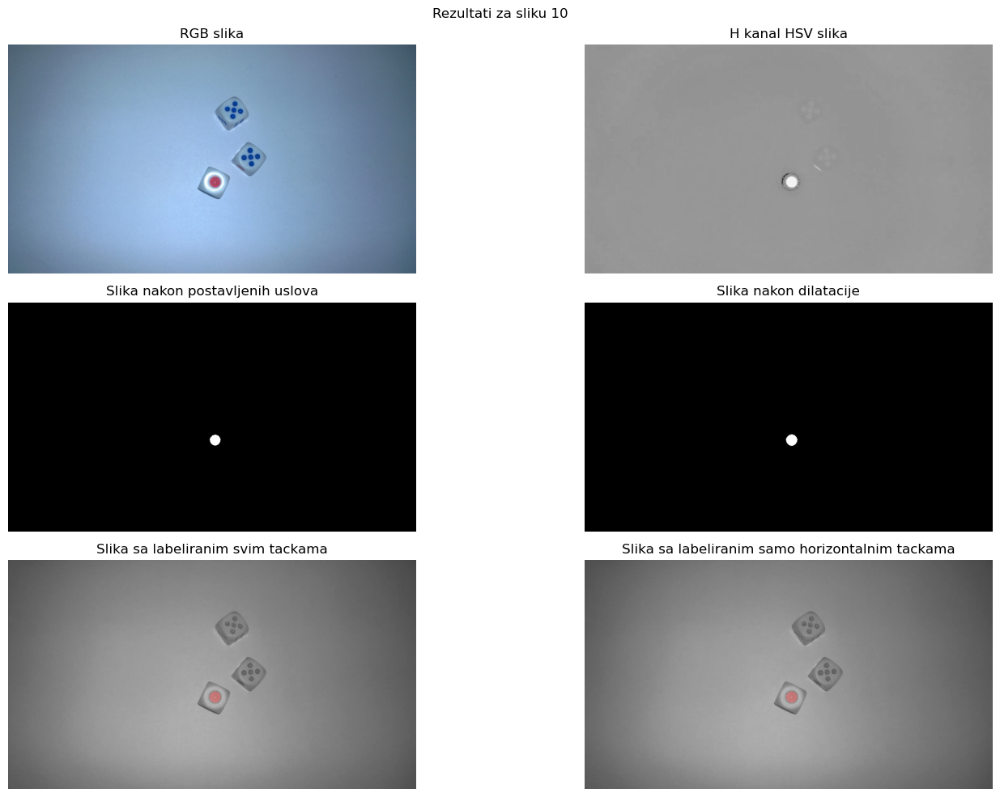

In [10]:
plot_blue_score_results(dices[10], 'Rezultati za sliku 10','red')

Zbir je:5


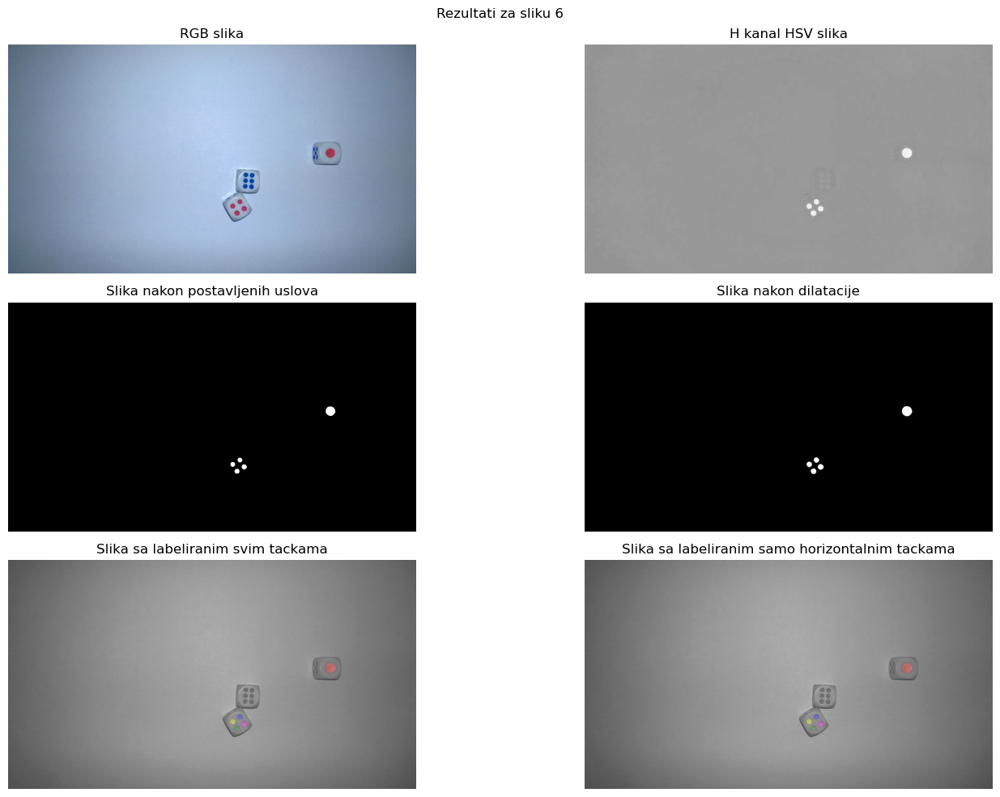

In [11]:
plot_blue_score_results(dices[6], 'Rezultati za sliku 6','red')

Zbir je:5


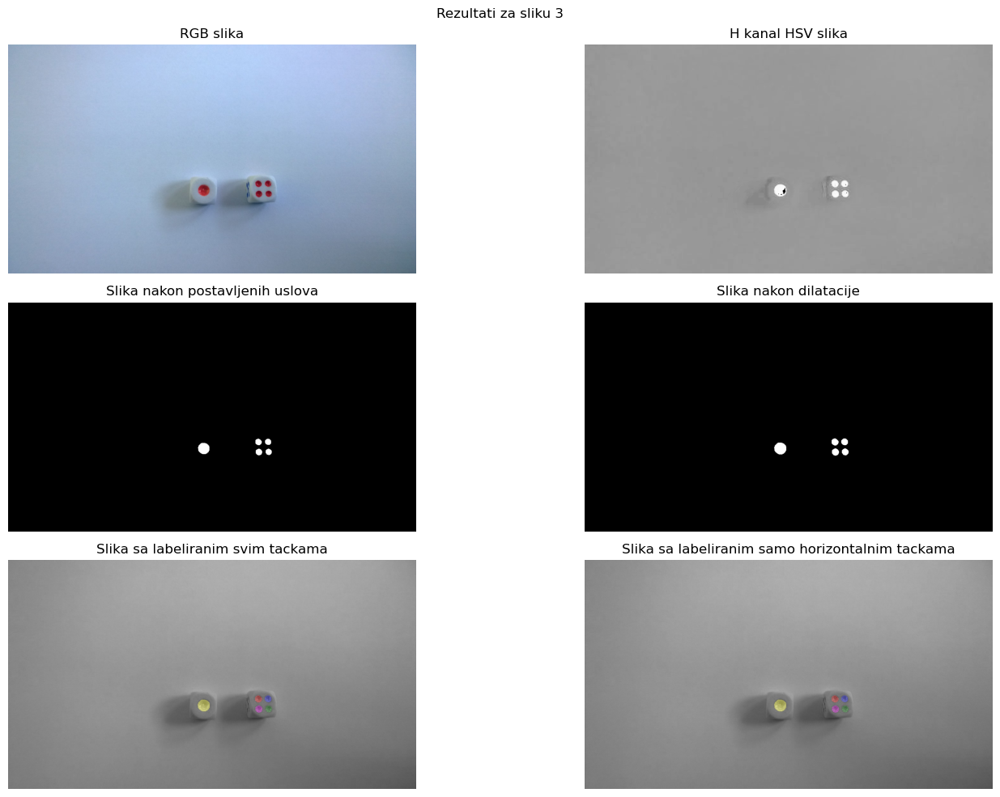

In [12]:
plot_blue_score_results(dices[3], 'Rezultati za sliku 3', 'red')

### Krajnja funkcija

In [13]:
def extract_dice_score(img):
    ''' img - input image
        output - blue and red score of rolled dices in the image
    '''
    # calculating blue score
    (_,_,_,_,blue_score,_) = extract_color_dice_score(img, 'blue')
    # calculating red score
    (_,_,_,_,red_score,_) = extract_color_dice_score(img, 'red')
    print("Red score is: "+str(red_score)+". Blue score is: "+str(blue_score))
    
    return (red_score, blue_score)

In [14]:
for i in dices.keys():
    print("For image number: "+ str(i))
    extract_dice_score(dices[i])

For image number: 1
Red score is: 0. Blue score is: 8
For image number: 10
Red score is: 1. Blue score is: 10
For image number: 11
Red score is: 0. Blue score is: 5
For image number: 12
Red score is: 4. Blue score is: 5
For image number: 2
Red score is: 4. Blue score is: 5
For image number: 3
Red score is: 5. Blue score is: 0
For image number: 4
Red score is: 0. Blue score is: 10
For image number: 5
Red score is: 4. Blue score is: 6
For image number: 6
Red score is: 5. Blue score is: 6
For image number: 7
Red score is: 0. Blue score is: 6
For image number: 8
Red score is: 4. Blue score is: 9
For image number: 9
Red score is: 0. Blue score is: 8


Ako pogledamo slike zakljucujemo da su svi dobijeni rezultati tacni.

## Bonus deo

Ideja je da ako dve tacke pripadaju istoj kocki onda ce one biti najvise na rastojanju 2*precnik tacke u slucaju broja 2 npr. S obzirom da za sve regione imamo njihove centre sto nam daje rastojanje preko euklidske distance a precnik kruga mozemo aproksimirati kao stranicu bound box-a oko njega. Ispisivanjem stranica bound box-a mozemo se uveriti da sve tacke unutar jedne kockice imaju isti poluprecnik tacke sa greskom 1. (Npr ako je precnik 16 stranice svih bound box-ova tacaka na toj kocki ce biti izmedju 15 i 17). 

Skup implementiramo kao numpy niz duzine jednakoj broju regiona. Na pocetku ce mu svi elementi biti razliciti
sto ce oznacavati da je svaki element skup za sebe. Pri prolasku kroz sve parove tacaka, kada naidjemo na par tacaka za koji
vidimo da pripada istoj kocki upisacemo nizi indeks na mesto viseg u nizu skupova cime cemo zapravo napraviti uniju ova dva 
skupa. Nakon prolaska kroz sve parove regioni ce biti podeljeni u onoliko skupova koliko ima kockica na slici i ove skupove cemo dobiti pozivanjem funkcije np.unique sa argumentom return_counts = True koja vraca sve jedinstvene elemente niza ( u nasem slucaju indeks skupa) i njihov broj ( u nasem slucaju broj na kockici). Iz ovog razloga je dovoljno vratiti samo drugi niz koji nam vrati funkcija. Da bismo program napravili efikasnijim mozemo staviti naredbu break prvi put kada nadje ovakvu tacku jer nema potrebe dalje da proveravamo kojoj kocki pripada.

In [15]:
def form_dices(dot_regions):
    '''
        input : dot_regions - dot regions returned by extract_dice_score
        output: numpu array with numbers on dices
        
        Divides regions into sets so that all dots in one dice are same set. After that, it counts dots on every dice and 
        returns them as output.
    '''
    # in the beginning every dot is set of itself
    sets = np.arange(1,len(dot_regions)+1)
    for i in range(0, len(dot_regions)):
        for j in range(i+1, len(dot_regions)):
            # if distance between two dots is smaller than 2 times dot diameter than it is same dice
            # ( it could be checked when printing diameters that all dots on one dice have same diameter with error 1)
            center1 = dot_regions[i]['Centroid']
            center2 = dot_regions[j]['Centroid']
            center_dist = np.sqrt(np.square(center1[0]-center2[0])+np.square(center1[1]-center2[1]))
            diameter = np.abs(dot_regions[i].bbox[0]-dot_regions[i].bbox[2])
            if(center_dist<= 2*diameter):
                # if dot i is on same dice as dot j -> set same index
                sets[j] = sets[i]
    return np.unique(sets, return_counts = True)[1];

In [16]:
def extract_dice_score_bonus(img):
        # calculating blue score
    (_,_,_,_,_,blue_regions) = extract_color_dice_score(img, 'blue')
    # calculating red score
    (_,_,_,_,_,red_regions) = extract_color_dice_score(img, 'red')
    red_numbers = form_dices(red_regions)
    blue_numbers = form_dices(blue_regions)
    print("Red numbers are:")
    print(red_numbers)
    print("Blue numbers are:")
    print(blue_numbers)
    return(red_numbers, blue_numbers)

In [17]:
for i in dices.keys():
    print("For image number: "+ str(i))
    extract_dice_score_bonus(dices[i])
    print("####################################")

For image number: 1
Red numbers are:
[]
Blue numbers are:
[6 2]
####################################
For image number: 10
Red numbers are:
[1]
Blue numbers are:
[5 5]
####################################
For image number: 11
Red numbers are:
[]
Blue numbers are:
[3 2]
####################################
For image number: 12
Red numbers are:
[4]
Blue numbers are:
[5]
####################################
For image number: 2
Red numbers are:
[4]
Blue numbers are:
[5]
####################################
For image number: 3
Red numbers are:
[4 1]
Blue numbers are:
[]
####################################
For image number: 4
Red numbers are:
[]
Blue numbers are:
[5 5]
####################################
For image number: 5
Red numbers are:
[4]
Blue numbers are:
[6]
####################################
For image number: 6
Red numbers are:
[1 4]
Blue numbers are:
[6]
####################################
For image number: 7
Red numbers are:
[]
Blue numbers are:
[6]
###########################

Ako pogledamo slike vidimo da su sve liste ispravno formirane.

### detaljan prikaz izgleda skupa za poslednju kockicu

In [18]:
(_,_,_,_,_,dot_regions) = extract_color_dice_score(dices[9], 'blue')
# in the beginning every dot is set of itself
sets = np.arange(1,len(dot_regions)+1)
print(sets)
for i in range(0, len(dot_regions)):
    for j in range(i+1, len(dot_regions)):
        # if distance between two dots is smaller than 2 times dot diameter than it is same dice
        # ( it could be checked when printing diameters that all dots on one dice have same diameter with error 1)
        center1 = dot_regions[i]['Centroid']
        center2 = dot_regions[j]['Centroid']
        center_dist = np.sqrt(np.square(center1[0]-center2[0])+np.square(center1[1]-center2[1]))
        diameter = np.abs(dot_regions[i].bbox[0]-dot_regions[i].bbox[2])
        if(center_dist<= 2*diameter):
            # if dot i is on same dice as dot j -> set same index
            sets[j] = sets[i]
            print(sets)
            break;
print(np.unique(sets, return_counts = True))

[1 2 3 4 5 6 7 8]
[1 1 3 4 5 6 7 8]
[1 1 1 4 5 6 7 8]
[1 1 1 4 4 6 7 8]
[1 1 1 4 4 4 7 8]
[1 1 1 4 4 4 7 7]
(array([1, 4, 7]), array([3, 3, 2], dtype=int64))


# Zadatak 2

Za odredjivanje horizontalnih i vertikalnih gradijenata najcesce se koristi Sobelov filtar. Nakon primene ove funkcije imacemo izdvojene horizontalne i vertikalne ivice, kao i magnitudu i ugao gradijenta koji ce nam nadalje biti potrebni.

In [19]:
def sobel_filter(img):
    ''' Input: img - image to be filtered
        Output: G - gradient magnitude
                angle - gradient angle
                Gx - horizontal edges
                Gy - vetical edges
        Function for finding horizontal and vertical edges as well as gradient angle and magnitude.
    
    '''  
    Hx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Hy = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    # horizontal edges
    Gx = ndimage.filters.convolve(img, Hx)
    # vertical edges
    Gy = ndimage.filters.convolve(img, Hy)
    # gradient magnitude
    G = np.sqrt(np.square(Gx) + np.square(Gy))
    # gradient angle
    angle = np.rad2deg(np.arctan2(Gy, Gx))
    
    fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (16,8))
    
    fig.suptitle('Izlaz sobelovog filtra')
    im0 = ax[0].imshow(G, cmap = 'gray', vmin = 0, vmax = 255)
    ax[0].set_axis_off()
    ax[0].set_title('Magnituda')
    
    im1 = ax[1].imshow(180+angle, cmap = 'jet', vmin = 0, vmax = 180)
    ax[1].set_axis_off()
    ax[1].set_title('Ugao')
    
    fig.colorbar(im0,ax = ax[0], fraction=0.03, pad=0.04)
    fig.colorbar(im1,ax = ax[1], fraction=0.03, pad=0.04)
    
    return (G, angle, Gy, Gx)

Sledeca funkcija za svaki piksel unutar slike detektuje pravac gradijenta, a zatim posmatra da li je kada posmatramo masku 3*3 i piksele unutar nje po tom pravcu piksel koji trenutno posmatramo ujedno maksimalnog intenziteta. Ako jeste, treba ga zadrzati ali ako nije treba ga odbaciti. Cilj ovoga je da smanjimo debljinu ivica na jedan piksel.

In [20]:
def non_max_suppression(G, angle):
    ''' Input: G - input image gradient magintude
        Output: J - gradient magnitude after non max suppression
        
        Performs non max supression.
    '''
    M, N = G.shape
    J = np.zeros((M,N), dtype = np.uint32)
    # line with angle alpha is same as 180+alpha but it is easier if angles are in interval[0,180]
    angle[angle<0] += 180
    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
               
                is_max = False;
                
                #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                     is_max = (np.max(G[i, j-1:j+2])==G[i,j])
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    is_max = (max(G[i+1, j-1],G[i-1, j+1],G[i,j])== G[i,j])
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    is_max = (max(G[i-1:i+2, j])==G[i,j])
                #input angle - 45 ( same as output angle 135 )
                elif (112.5 <= angle[i,j] < 157.5):
                    is_max =(max( G[i-1, j-1], G[i+1, j+1], G[i, j]) ==  G[i,j])

                if (is_max == True) :
                    J[i,j] = G[i,j]

            except IndexError as e:
                pass
    
    return J

Pri doredjivanju praga moramo da pazimo da on ne bude premali jer cemo tada dobiti previse laznih ivica, ali ni preveliki jer onda necemo detektovati sve potrebne ivice. Zato koristimo dva praga low i high treshold. Sve ivice koje su iznad high threshold-a su sigurno bitne ( strong edges ) , i sve ispod low threshold-a su sigurno nebitne i njih izbacujemo.

In [21]:
def high_low_map(img, lt=50, ht=230):
    '''
        Input: img - input image
               lt - low threshold
               ht - high threshold
        Output:
               edges -  image with strong edges intensity 255 and weak edges intensity 128
        Function for finding weak and strong edges.
    '''
    M, N = img.shape
    edges = np.zeros((M,N), dtype=np.int32)
    
    edges[img>=ht] = 255
    edges[(img<ht) & (img>=lt)] = 128
    
    return edges

Za one koje se nalaze izmedju ova dva praga nismo sigurni da li su bitne ili ne. Iz tog razloga nakon njihovog detektovanja proveravamo da li u prozoru 3*3 oko njih postoji neki piksel koji pripada jakoj ivici. Ako postoji, onda i ovaj piksel prikljucujemo jakoj ivici a ako ne postoji onda se ona brise.

In [22]:
def check_weak_edges(img):
    '''
       img - map of strong and weak edges
       J - image after transforming weak edges into strong edges or deleting them
       
       Function for deciding whethere weak edge should be deleted or not.
    '''
    M, N = img.shape
    J = img.copy()
    for i in range(1,M-1):
        for j in range(1,N-1):
            if(img[i,j] == 128 ):
                if(np.max(img[i-1:i+2, j-1:j+2]) == 255):
                    J[i,j] = 255
                else:
                    J[i,j] = 0
    return J;

Finalna funkcija sastoji se od poziva svih koraka funkcije pojedinacno.

In [23]:
def canny_edge_detection(I, sigma, low_threshold, high_threshold):
    '''
        Input: I - input image
               sigma - standard deviation for gaussian filter
               low_threshold - low threshold in hysteresis
               high_threshold - high threshold in hysteresis
        Output: img_final - image with detected edges
        
        Function performing canny edge detection.
               
    '''
    win_size = np.ceil(6*sigma)
    if(win_size%2 == 0):
        win_size += 1;
        
    # filtering image 
    if sigma != 0: 
        img_gauss = skimage.filters.gaussian(I, sigma = sigma,truncate = win_size/sigma, mode = 'mirror' )
    else:
        img_gauss = I;
    # gradient magnitude and angle
    (G, angle, Gx, Gy) = sobel_filter(255*img_gauss)
    # non max supression
    img_supress = non_max_suppression(G, angle)
    # map of high and low edges
    img_map = high_low_map(img_supress,low_threshold, high_threshold)
    img_final = check_weak_edges(img_map)
    
    # plotting all results
    fig, axes = plt.subplots(ncols = 3, nrows = 2, figsize = (16,10))
    ax = axes.ravel()
    
    ax[0].imshow(I, cmap = 'gray', vmin = 0, vmax = 255)
    ax[0].set_title('Originalna slika')
    ax[0].set_axis_off()
    ax[1].imshow(Gx, cmap = 'gray',vmin = 0, vmax = 255)
    ax[1].set_title('Horizontalne ivice')
    ax[1].set_axis_off()
    ax[2].imshow(Gy, cmap = 'gray', vmin = 0, vmax = 255)
    ax[2].set_title('Vertikalne ivice')
    ax[2].set_axis_off()
    ax[3].imshow(img_supress, cmap = 'gray', vmin = 0, vmax = 255)
    ax[3].set_title('Nakon potiskivanje ne lokalnih maksimuma')
    ax[3].set_axis_off()
    ax[4].imshow(img_map, cmap = 'gray', vmin = 0, vmax = 255)
    ax[4].set_title('Slabe i jake ivice')
    ax[4].set_axis_off()
    ax[5].imshow(img_final, cmap = 'gray', vmin = 0, vmax = 255)
    ax[5].set_title('Finalna slika ivica')
    ax[5].set_axis_off()
    return img_final

### Lena

Postavicemo standardnu devijaciju na malu vrednost s obzirom da slika nema sum.

Kada se oba praga stave na male vrednosti pojavljuje se veliki broj i jakih i slabih ivica. Poenta donjeg praga je da izbaci sve nebitne delove slike a poenta gornjeg praga je da od delova slike na kojima se nalaze bitni detalji odvoji bitne od nebitnih ivica.

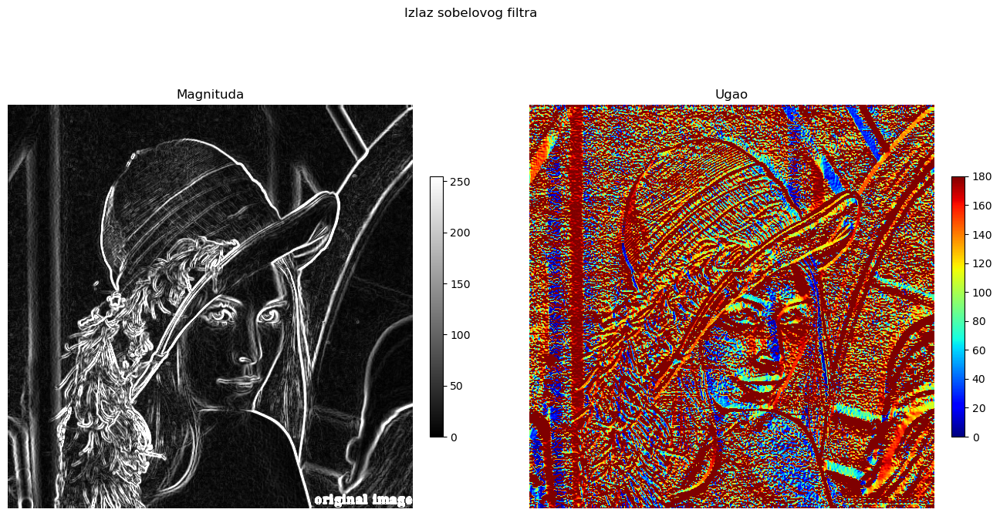

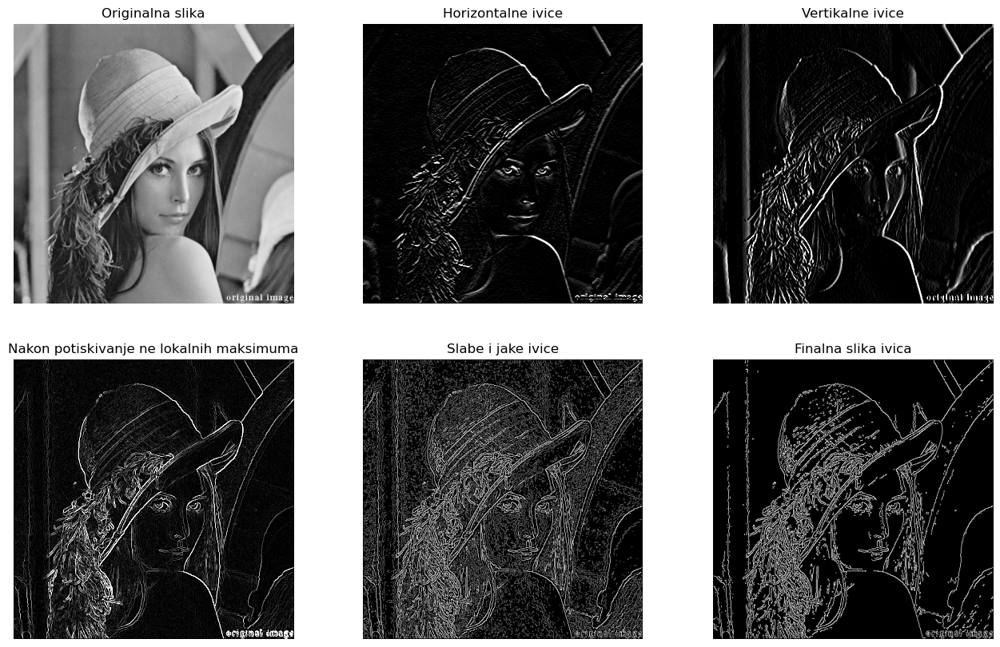

In [24]:
img = skimage.io.imread('../sekvence/lena.tif')
lena_output_1 = canny_edge_detection(img,0.01,20 ,80)

Sa sledecim parametrima postigli smo da vise nema tackica na pozadini koje nisu bitne za ivice koje zelimo da izdvojimo, a da od delova gde se nalaze bitne ivice sto vise izdvojimo bas njih. Ipak, ovde moramo da pravimo kompromis izmedju tackica na licu i toga da se vide usta.

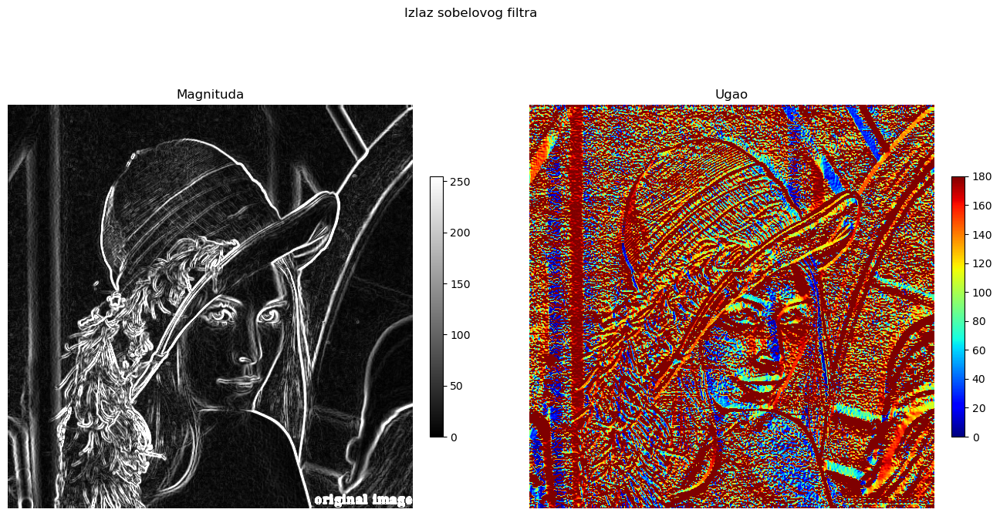

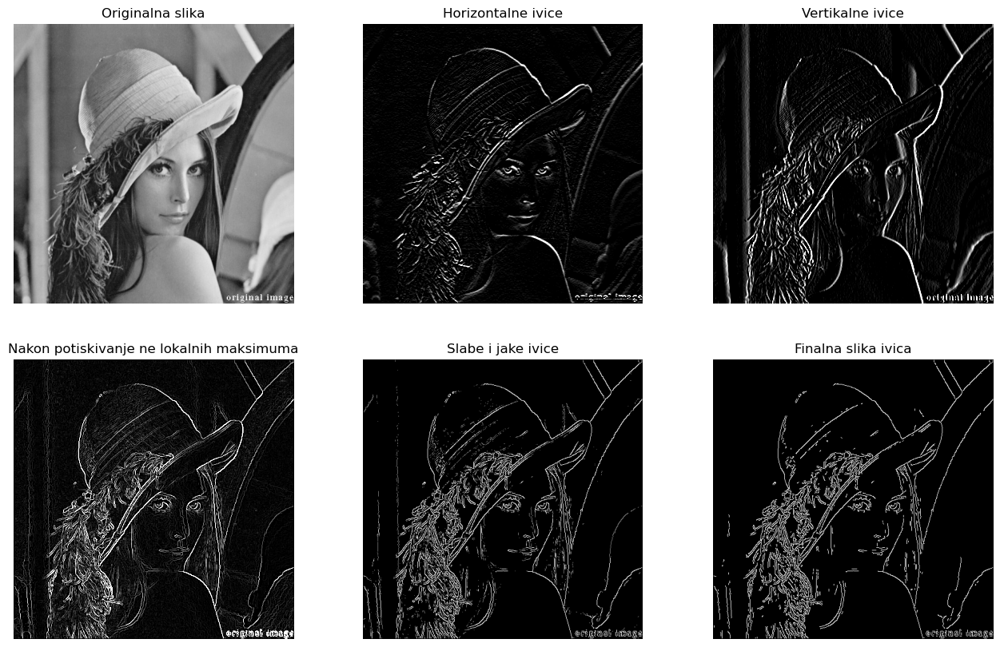

In [25]:
lena_output_2 = canny_edge_detection(img,0.01,100 ,150)

Kada je gornji prag preveliki ne vide se detalji lica poput ustai nosa.

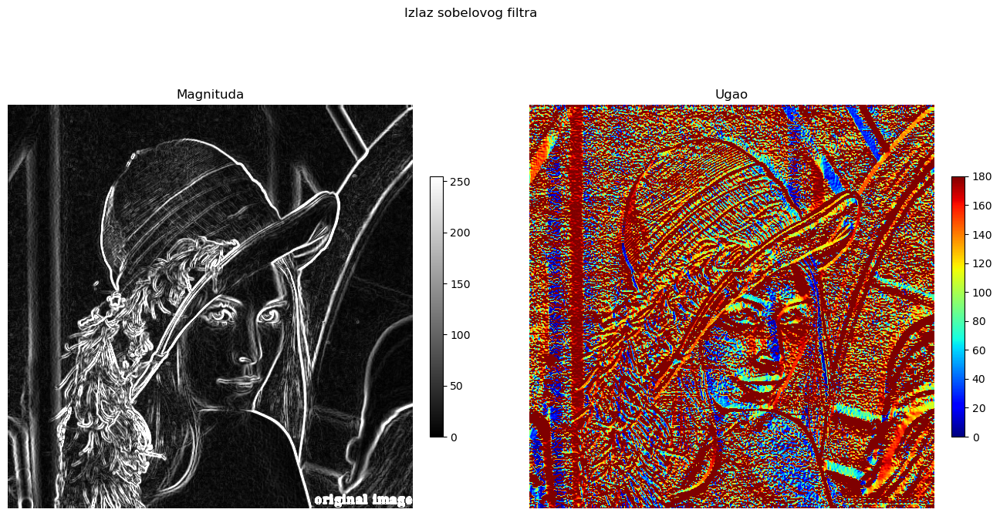

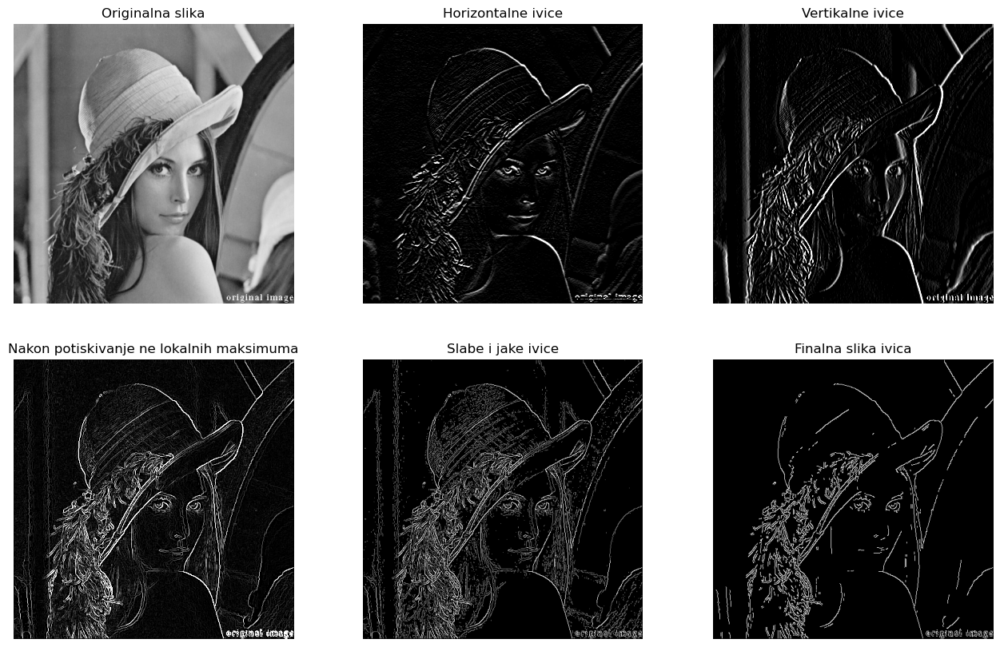

In [26]:
lena_output_3 = canny_edge_detection(img,0.01,50 ,200)

Ako donji prag postavimo previse visoko on ce biti previse blizak gornjem cime cemo izgubiti efekat histerezisa i dobiti skoro pa samo jednu granicu odlucivanja i slabe ivice skoro da nece postojati.

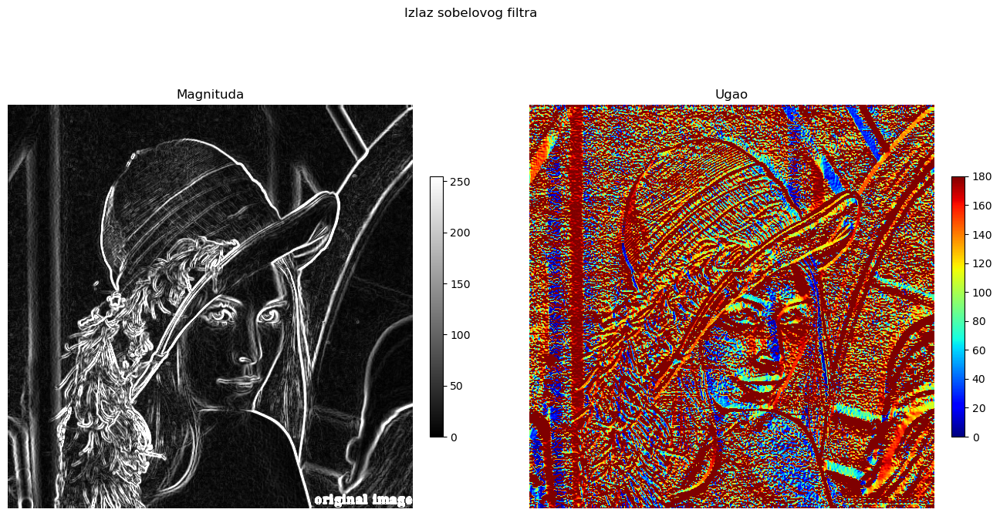

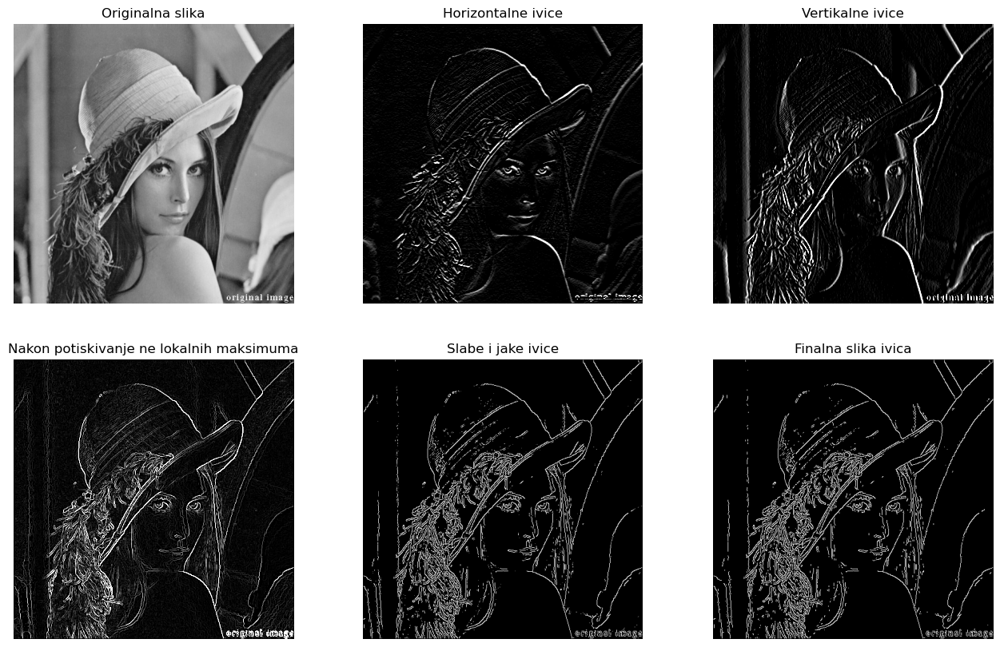

In [27]:
lena_output_4 = canny_edge_detection(img,0.01,100 ,110)

### Ostale slike

Podesavajuci optimalne parametre za sliku kamermana pravljen je kompromis izmedju toga da se vidi ruka i da ne iskoci sum u pozadini ili detalji na odeci. Standardna devijacija je postavljena da bude velika jer vidimo da slika ima dosta suma.

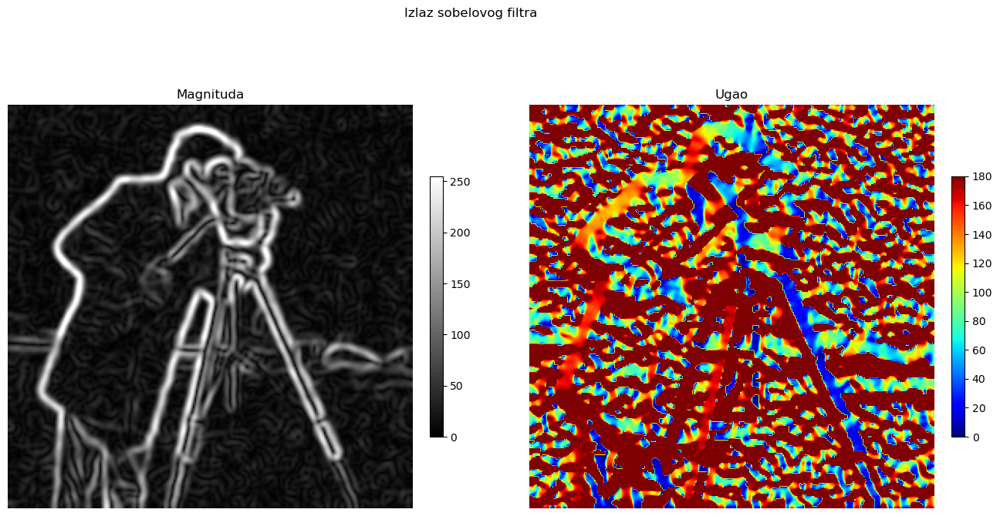

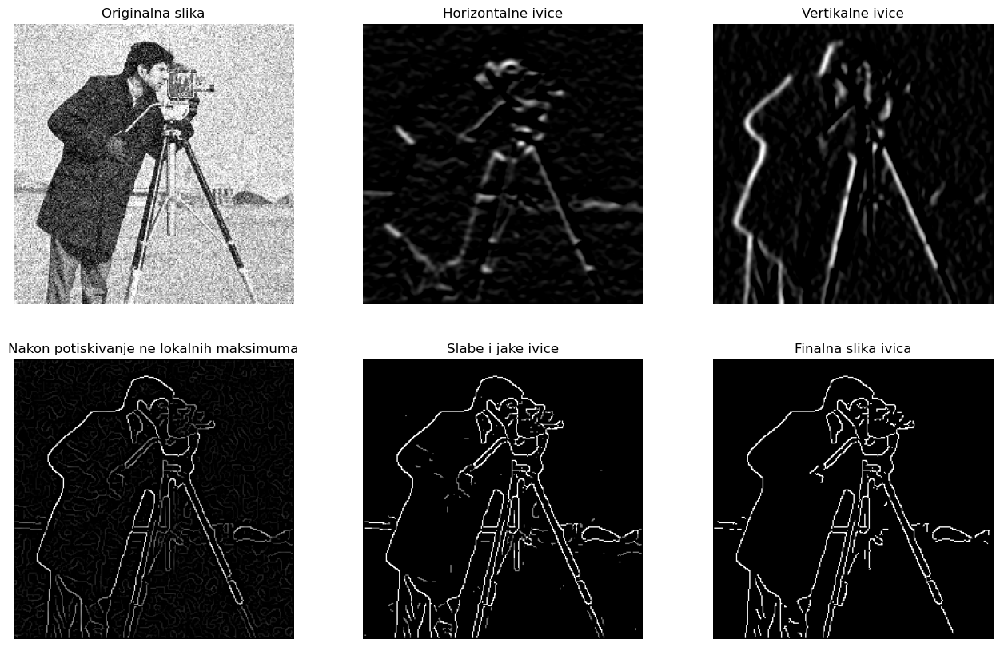

In [28]:
img = skimage.io.imread('../sekvence/camerman.tif')
camerman_output = canny_edge_detection(img,2, 50, 80)

Primetimo da su horizontale zelene ( jer je normala na njih 90 stepeni) a vertikale plave ( jer je normala na njih 0 stepeni). Parametri su podeseni tako da se vide svi detalji slike koje je moguce videti iz magnitude bez da izkoce tackice po uniformnim delovima i da se sto manje vide tragovi tablice, s obzirom da ju je svakako nemoguce procitati jer se ne vidi na magnitudi.

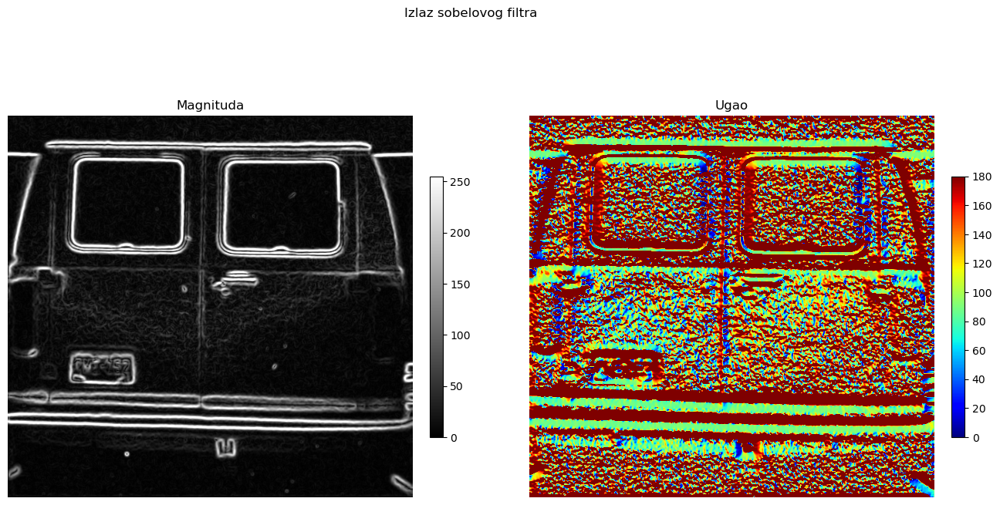

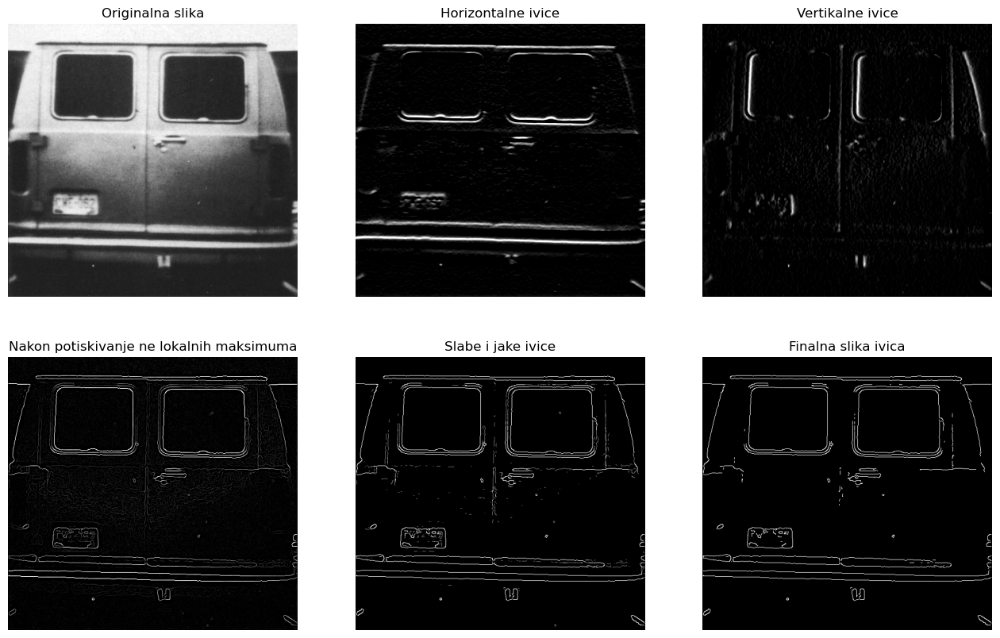

In [29]:
img = skimage.io.imread('../sekvence/van.tif')
van_output = canny_edge_detection(img,1, 60, 100)

Primetimo da su odgovarajuce strane krova narandzasta ( jer je normala na nju 135 stepeni) i plava (jer je normala na nju 45 stepeni). A horizontala je ponovo zelena. Crepove je nemoguce skroz detektovati i iz tog razloga podesavamo parametre tako da se crepovi uopste ne vide. Pravimo kopromis izmedju iskakanja delova crepova i vidljivosti ostalih ivica kuce.

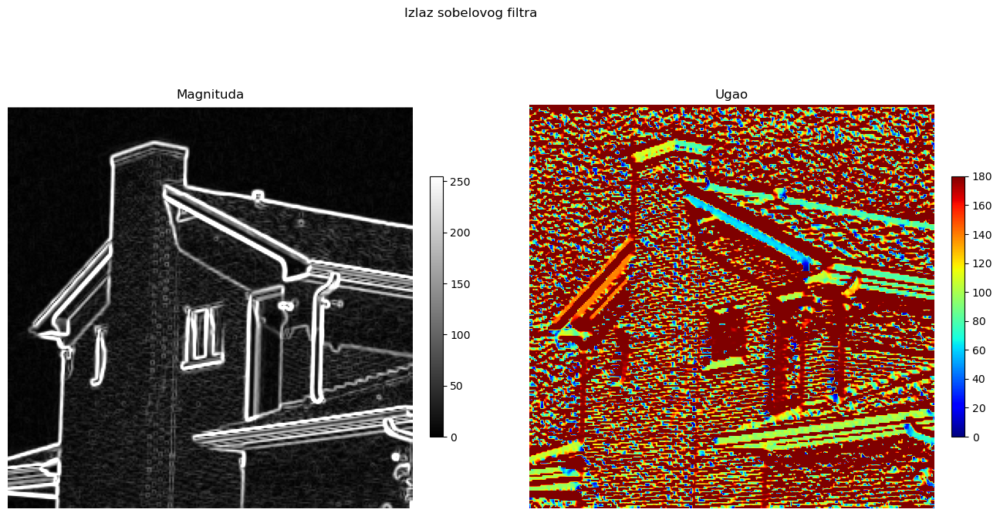

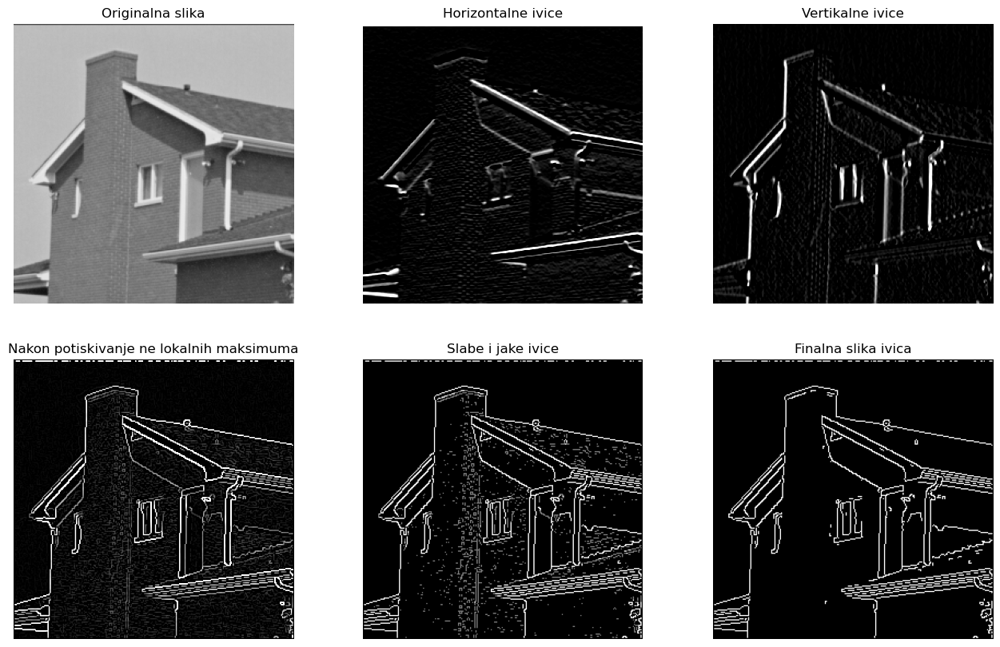

In [30]:
img = skimage.io.imread('../sekvence/house.tif')
house_output = canny_edge_detection(img,0.1, 50, 115)